### **Data Augmentation, 데이터 증강**
- 이미지의 종류와 개수가 적으면, CNN 모델의 성능이 떨어질 수 밖에 없다. 또한 몇 안되는 이미지로 훈련시키면 과적합이 발생한다.
- CNN 모델의 성능을 높이고 과적합을 개선하기 위해서는 이미지의 종류와 개수가 많아야한다. 즉, 데이터의 양을 늘려야한다.
- 이미지 데이터는 학습 데이터를 수집하여 양을 늘리기 쉽지 않기 때문에, 원본 이미지를 변형시켜서 양을 늘릴 수 있다.
- Data Augmentation을 통해 원본 이미지에 다양한 변형을 주어서 학습 이미지 데이터를 늘리는 것과 유사한 효과를 볼 수 있다.
- 원본 학습 이미지의 개수를 늘리는 것이 아닌 매 학습마다 개별 원본 이미지를 변형해서 학습을 수행한다.

<img src="./images/data_augmentation.png" width="400" style="margin-left: 30px">

#### 공간 레벨 변형
- 좌우 또는 상하 반전, 특정 영역만큼 확대, 축소, 회전 등으로 변형시킨다.


#### 픽셀 레벨 변형
- 밝기, 명암, 채도, 색상 등을 변형시킨다.

In [1]:
with open('./datasets/animals/translate.py') as f:
    content = f.readline()
    contents1 = eval(content[content.index('{'):content.index('}') + 1])
    contents2 = {v : k for k, v in contents1.items()}

print(contents1, contents2, sep='\n')

{'cane': 'dog', 'cavallo': 'horse', 'elefante': 'elephant', 'farfalla': 'butterfly', 'gallina': 'chicken', 'gatto': 'cat', 'mucca': 'cow', 'pecora': 'sheep', 'scoiattolo': 'squirrel', 'dog': 'cane', 'elephant': 'elefante', 'butterfly': 'farfalla', 'chicken': 'gallina', 'cat': 'gatto', 'cow': 'mucca', 'spider': 'ragno', 'squirrel': 'scoiattolo'}
{'dog': 'cane', 'horse': 'cavallo', 'elephant': 'elefante', 'butterfly': 'farfalla', 'chicken': 'gallina', 'cat': 'gatto', 'cow': 'mucca', 'sheep': 'pecora', 'squirrel': 'scoiattolo', 'cane': 'dog', 'elefante': 'elephant', 'farfalla': 'butterfly', 'gallina': 'chicken', 'gatto': 'cat', 'mucca': 'cow', 'ragno': 'spider', 'scoiattolo': 'squirrel'}


In [2]:
from glob import glob
import os

root = './datasets/animals/original/'

directories = glob(os.path.join(root, '*'))

for directory in directories:
    try:
        os.rename(directory, os.path.join(root, contents1[directory[directory.rindex('\\') + 1:]]))
    except KeyError as e:
        os.rename(directory, os.path.join(root, contents2[directory[directory.rindex('\\') + 1:]]))

In [3]:
root = './datasets/animals/original/'

directories = glob(os.path.join(root, '*'))
directory_names = []
for directory in directories:
    directory_names.append(directory[directory.rindex('\\') + 1:])

print(directory_names)

['butterfly', 'cat', 'chicken', 'cow', 'dog', 'elephant', 'horse', 'sheep', 'spider', 'squirrel']


In [4]:
root = './datasets/animals/original/'

for name in directory_names:
    for i, file_name in enumerate(os.listdir(os.path.join(root, name))):
        old_file = os.path.join(root + name + '/', file_name)
        new_file = os.path.join(root + name + '/', name + str(i + 1) + '.png')

        os.rename(old_file, new_file)

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

root = './datasets/animals/original/'

idg = ImageDataGenerator(rescale=1./255)

generator = idg.flow_from_directory(
    root,
    # 튜플 형식으로 전달
    target_size=(250,250),
    # 한 번에 다 가져오면 하드웨어에 무리가 가기 때문에 나눠 가져오기 위해 배치사이즈 설정
    batch_size=32,
    class_mode='categorical'
)

print(generator.class_indices)

Found 26179 images belonging to 10 classes.
{'butterfly': 0, 'cat': 1, 'chicken': 2, 'cow': 3, 'dog': 4, 'elephant': 5, 'horse': 6, 'sheep': 7, 'spider': 8, 'squirrel': 9}


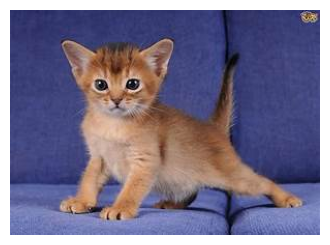

In [6]:
import cv2
import matplotlib.pyplot as plt
# 경로 읽어오기
# cv2.imread(generator.filepaths[3000])

# rgb로 읽어오기
image = cv2.cvtColor(cv2.imread(generator.filepaths[3002]), cv2.COLOR_BGR2RGB)

def show_image(image):
    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.axis('off')

show_image(image)

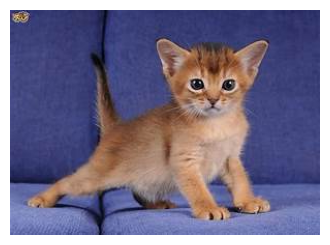

In [7]:
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Horizontal Filp: 좌우반전 적용
# 적용하더라도 반드시 변환되지 않는다. 특정 확률로 랜덤하게 적용하기 때문이다.
idg = ImageDataGenerator(horizontal_flip=True)

# ImageDataGenerator는 배치 사이즈를 포함한 4차원으로 연산되기 때문에
# 기존 image를 한 차원 증가시켜준다.
image_batch = np.expand_dims(image, axis=0)

# 4차원 이미지(배치사이즈 포함)를 fit에 전달한다.
idg.fit(image_batch)
# fit 한 뒤 flow에 다시 넣어준다.
data_generator = idg.flow(image_batch)
# 적용된 이미지를 next로 가져온다.
aug_image_batch = next(data_generator)

# 이미지를 시각화하기 위해 다시 3차원으로 차원 감소시켜준다.
aug_image = np.squeeze(aug_image_batch)
# 실수에서 정수로 변경 후 출력해준다.
show_image(aug_image.astype('int'))

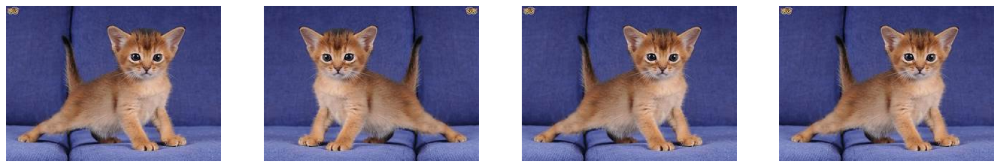

In [8]:
# 이미지 개수 입력하기
N_IMAGES = 4
fig, axs = plt.subplots(1, N_IMAGES, figsize=(22, 8))

for i in range(N_IMAGES):
    aug_image_batch = next(data_generator)
    aug_image = np.squeeze(aug_image_batch)
    aug_image = aug_image.astype('int')
    axs[i].imshow(aug_image)
    axs[i].axis('off')

In [9]:
def show_aug_image_batch(image, idg, n_images=4, to_int=True):
    image_batch = np.expand_dims(image, axis=0)
    idg.fit(image_batch)
    data_generator = idg.flow(image_batch)

    fig, axs = plt.subplots(1, n_images, figsize=(n_images * 5, 8))

    for i in range(N_IMAGES):
        aug_image_batch = next(data_generator)
        aug_image = np.squeeze(aug_image_batch)
        if to_int:
            aug_image = aug_image.astype('int')
            
        axs[i].imshow(aug_image)
        axs[i].axis('off')

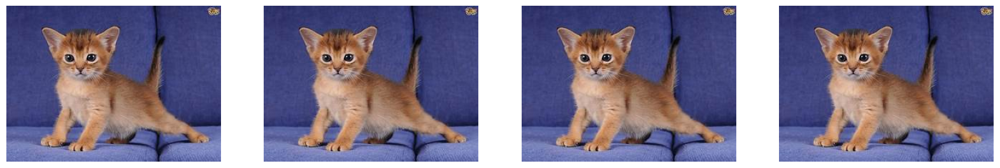

In [10]:
# Horizontal Filp: 좌우반전 적용
idg = ImageDataGenerator(horizontal_flip=True)
show_aug_image_batch(image, idg)

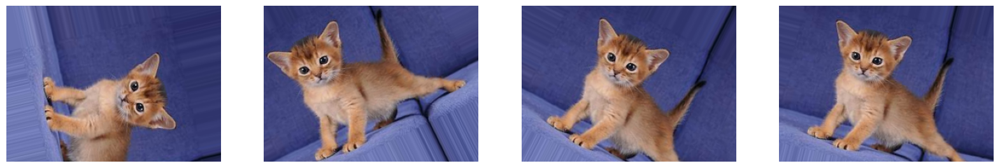

In [11]:
# rotation_range: 회전(0 ~ n)
idg = ImageDataGenerator(rotation_range=90)
show_aug_image_batch(image, idg)

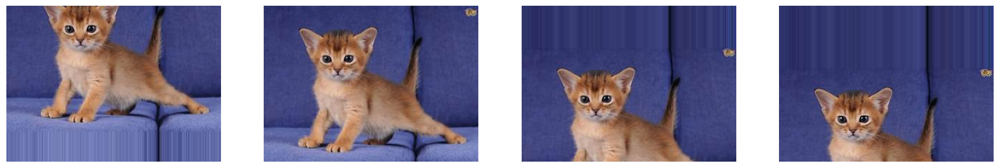

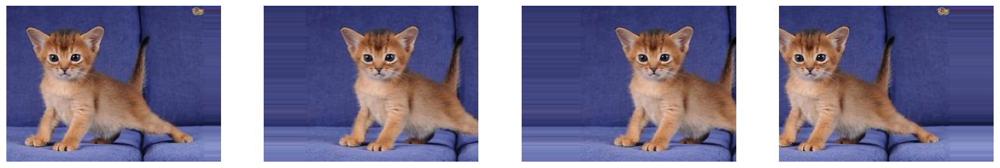

In [12]:
# width_shift_range
idg = ImageDataGenerator(width_shift_range=0.4)
show_aug_image_batch(image, idg)

# height_shift_range
idg = ImageDataGenerator(height_shift_range=0.4)
show_aug_image_batch(image, idg)

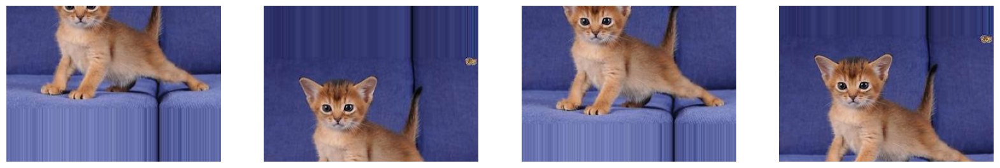

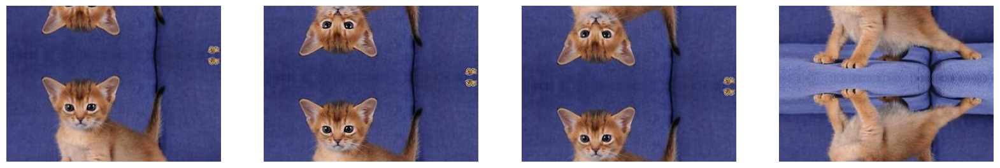

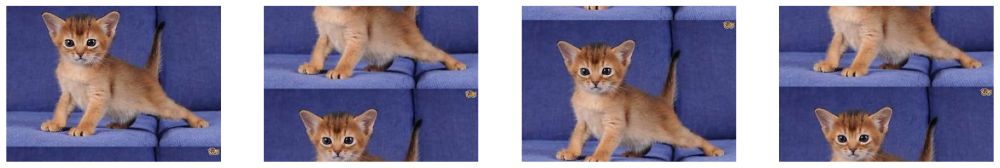

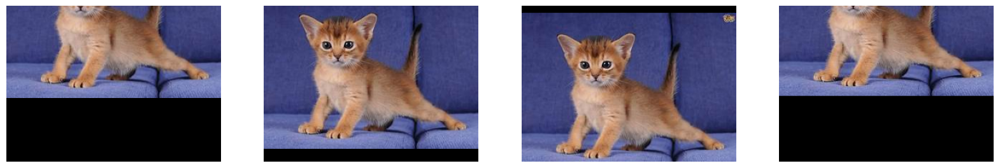

In [13]:
# 빈 공간을 가장 가까운 곳의 픽셀값으로 채움
idg = ImageDataGenerator(width_shift_range=0.4, fill_mode='nearest')
show_aug_image_batch(image, idg)

# 빈 공간을 해당 영역 근처 공간으로 채움
idg = ImageDataGenerator(width_shift_range=0.4, fill_mode='reflect')
show_aug_image_batch(image, idg)

# 빈 공간을 잘려나간 이미지로 채움
idg = ImageDataGenerator(width_shift_range=0.4, fill_mode='wrap')
show_aug_image_batch(image, idg)

# 특정 픽셀값(cval)으로 채움
idg = ImageDataGenerator(width_shift_range=0.4, fill_mode='constant', cval=0)
show_aug_image_batch(image, idg)

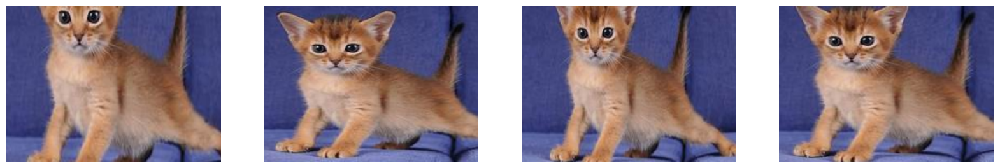

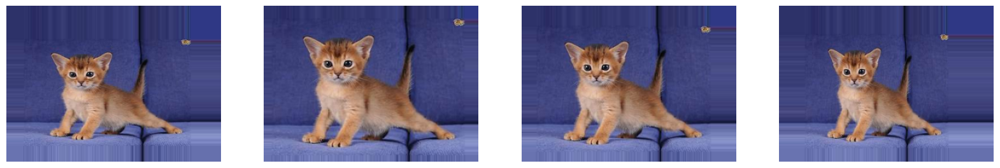

In [14]:
# Zoom in: 확대
idg = ImageDataGenerator(zoom_range=[0.5, 0.9])
show_aug_image_batch(image, idg)

# Zoom out: 축소
idg = ImageDataGenerator(zoom_range=[1.1, 1.5])
show_aug_image_batch(image, idg)

In [15]:
# 1보다 작으면 확대 1보다 작으면 축소

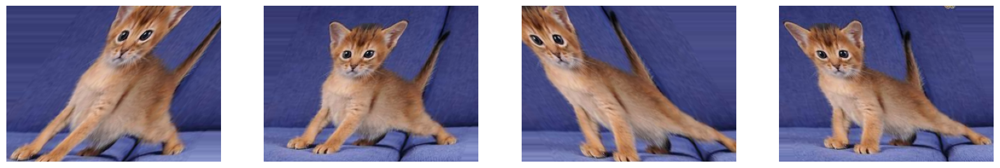

In [16]:
# Shear: 늘리기(0 ~ n)
idg = ImageDataGenerator(shear_range=45)
show_aug_image_batch(image, idg)

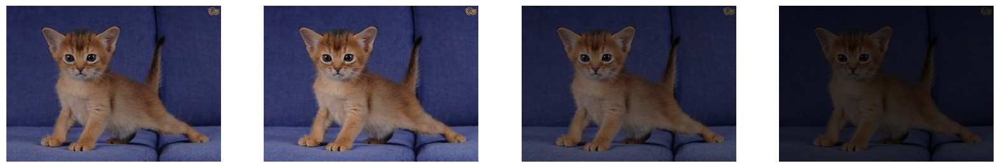

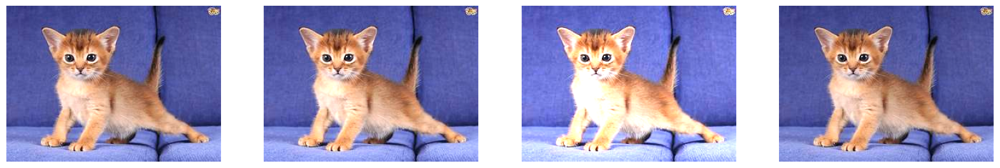

In [17]:
# Brightness: 밝기 조절
idg = ImageDataGenerator(brightness_range=(0.1, 0.9))
show_aug_image_batch(image, idg)

idg = ImageDataGenerator(brightness_range=(1.1, 1.9))
show_aug_image_batch(image, idg)

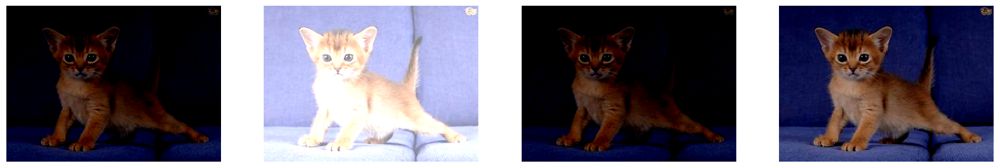

In [18]:
# Channel Shift: 채널 변경
idg = ImageDataGenerator(channel_shift_range=150)
show_aug_image_batch(image, idg)

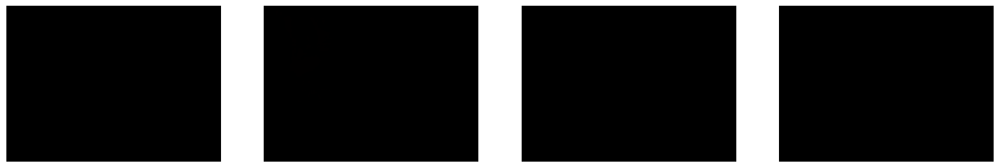

In [19]:
idg = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=(0.7, 1.3),
    horizontal_flip=True,
    vertical_flip=True,
    rescale=1./255
)
show_aug_image_batch(image, idg)

In [20]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

root = './datasets/animals/original/'

idg = ImageDataGenerator(rescale=1./255)
generator = idg.flow_from_directory(
    root,
    target_size=(250, 250),
    batch_size=32,
    class_mode='categorical'
)

print(generator.class_indices)

Found 26179 images belonging to 10 classes.
{'butterfly': 0, 'cat': 1, 'chicken': 2, 'cow': 3, 'dog': 4, 'elephant': 5, 'horse': 6, 'sheep': 7, 'spider': 8, 'squirrel': 9}


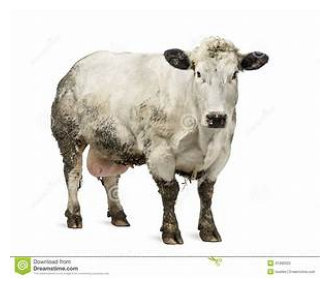

In [21]:
import cv2
import matplotlib.pyplot as plt

image = cv2.cvtColor(cv2.imread(generator.filepaths[7000]), cv2.COLOR_BGR2RGB)

def show_image(image):
    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.axis('off')

show_image(image)

In [22]:
def show_images(images, targets, ncols=4, title=None):
    figsize, axs = plt.subplots(figsize=(ncols * 5, 4), nrows=1, ncols=ncols)
    for i in range(ncols):
        axs[i].imshow(images[i])
        axs[i].set_title(targets[i])

def repeat_aug(original_image=None, target=None, aug=None, ncols=2):
    image_list = [original_image]
    target_list = ['Original']

    aug_image = aug(image=original_image)['image']
    image_list.append(aug_image)
    target_list.append(target)

    show_images(image_list, target_list, ncols=ncols)

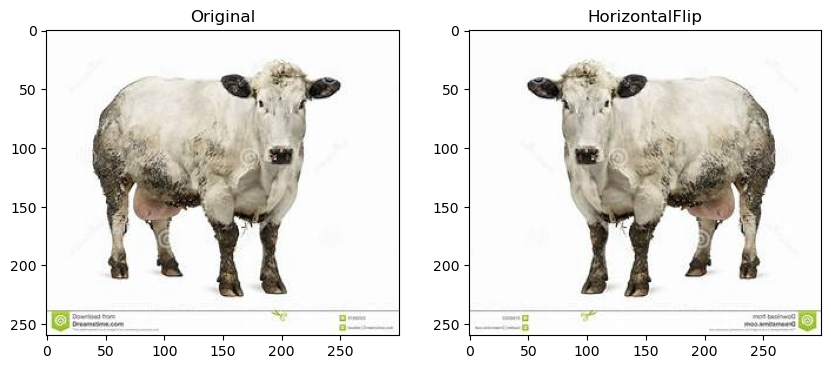

In [23]:
# conda install -c conda-forge albumentations
import albumentations as A

# p는 확률
aug = A.HorizontalFlip(p=0.5)
aug_image = aug(image=image)['image']

repeat_aug(original_image=image, target='HorizontalFlip', aug=aug)

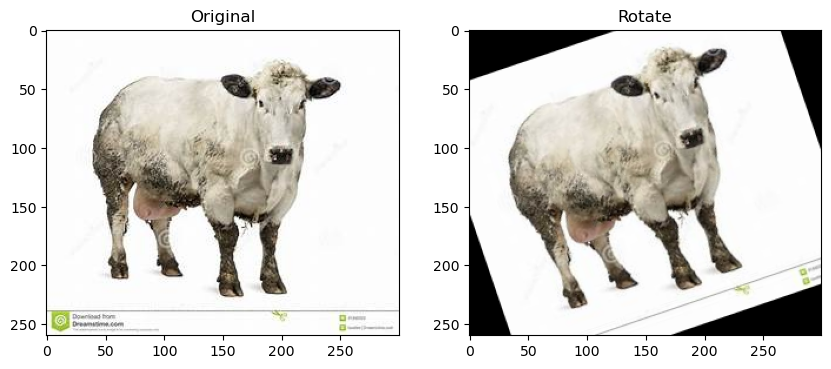

In [24]:
# rotate 를 쓸 때 limit=90일 경우 -90 ~ 90 범위를 갖는다.
# limit=90 일 경우 -90 ~ 90 범위를 갖는다.
# aug = A.Rotate(p=1, limit=90, border_mode=cv2.BORDER_REFLECT)
# aug = A.Rotate(p=1, limit=90, border_mode=cv2.BORDER_WRAP)
aug = A.Rotate(p=1, limit=90, border_mode=cv2.BORDER_CONSTANT)

repeat_aug(original_image=image, target='Rotate', aug=aug)

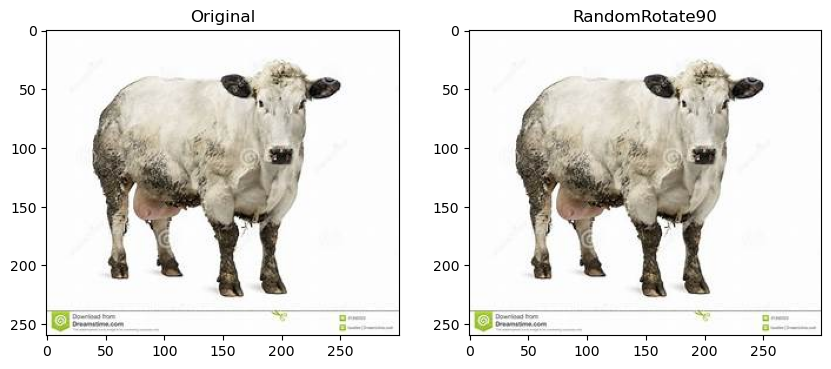

In [25]:
aug = A.RandomRotate90(p=1)

repeat_aug(original_image=image, target='RandomRotate90', aug=aug)

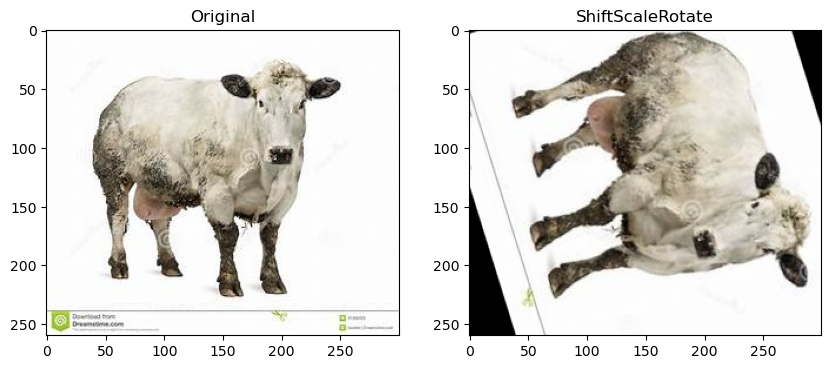

In [26]:
# shift와 scale(zoom), rotate를 함께 또는 별개로 적용, 별개로 적용할 경우 나머지 0으로 설정
aug = A.ShiftScaleRotate(shift_limit=0.5, scale_limit=(-0.8, 1.5), rotate_limit=90, p=1, border_mode=cv2.BORDER_CONSTANT)

repeat_aug(original_image=image, target='ShiftScaleRotate', aug=aug)

In [27]:
def show_images(images, targets, ncols=4, title=None):
    figsize, axs = plt.subplots(figsize=(ncols * 5, 4), nrows=1, ncols=ncols)
    for i in range(ncols):
        axs[i].imshow(images[i])
        axs[i].set_title(targets[i])
    plt.show()
    
def repeat_aug(original_image=None, target=None, aug=None, ncols=2):
    image_list = [original_image]
    target_list = ['Original']

    for i in range(ncols + 1):
        aug_image = aug(image=original_image)['image']
        image_list.append(aug_image)
        target_list.append(target)

    show_images(image_list, target_list, ncols=ncols)

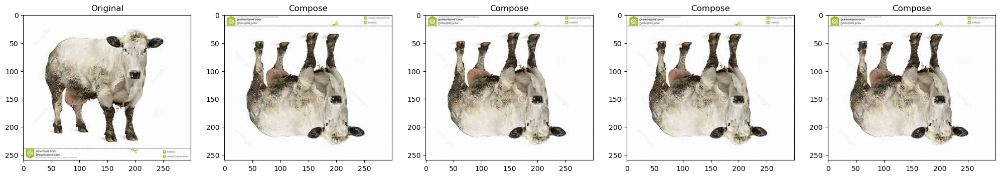

In [28]:
aug = A.Compose([
    A.VerticalFlip(p=0.5),
    A.HorizontalFlip(p=0.5)
])

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=5)

In [29]:
image.shape

(260, 300, 3)

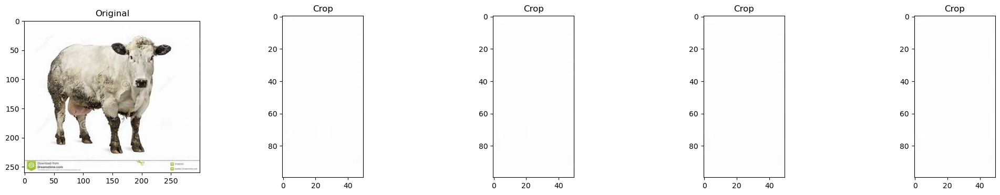

(100, 50, 3)

In [30]:
# 특정 영역을 잘라낸 후 원본 사이즈로 다시 Resize하지 않음
# x: width, y:height, max값은 이미지 크기로 설정해야한다.
aug = A.Crop(x_min=250, y_min=100, x_max=300, y_max=200, p=1)
repeat_aug(original_image=image, target='Crop', aug=aug, ncols=5)

aug(image=image)['image'].shape

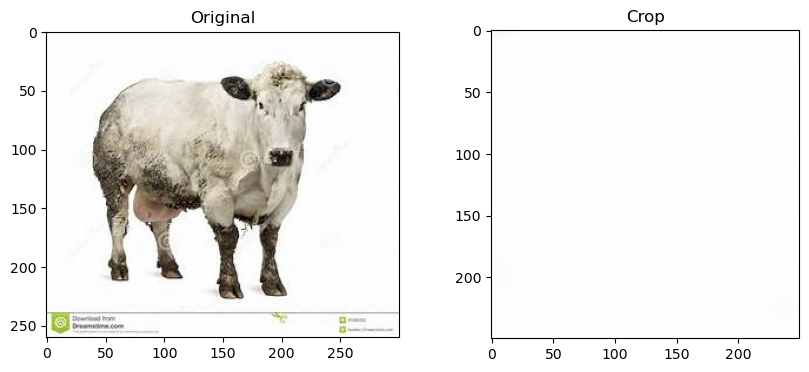

(250, 250, 3)

In [31]:
aug = A.Compose([
    A.Crop(x_min=250, y_min=100, x_max=300, y_max=200, p=1),
    A.Resize(250, 250)
])

repeat_aug(original_image=image, target='Crop', aug=aug)
aug(image=image)['image'].shape

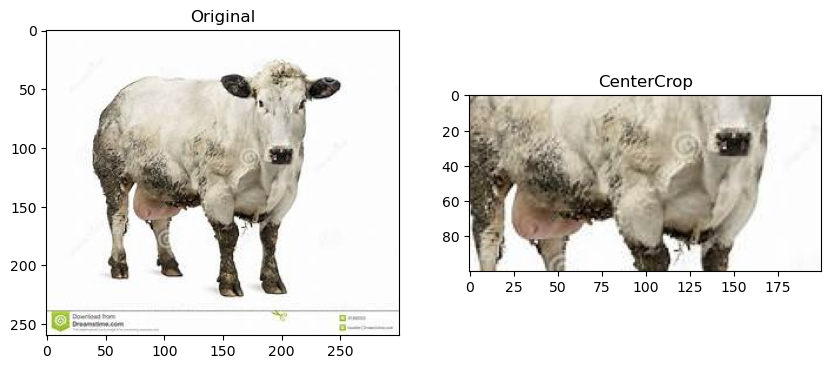

(100, 200, 3)

In [32]:
# height, width 원하는 사이즈 지정
aug = A.CenterCrop(height=100, width=200, p=1)

repeat_aug(original_image=image, target='CenterCrop', aug=aug)
aug(image=image)['image'].shape

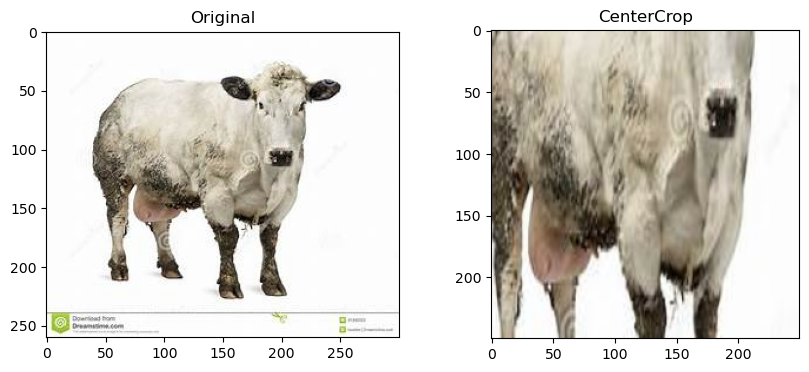

(250, 250, 3)

In [33]:
aug = A.Compose([
    A.CenterCrop(height=100, width=200, p=1),
    A.Resize(250, 250)
])

repeat_aug(original_image=image, target='CenterCrop', aug=aug)
aug(image=image)['image'].shape

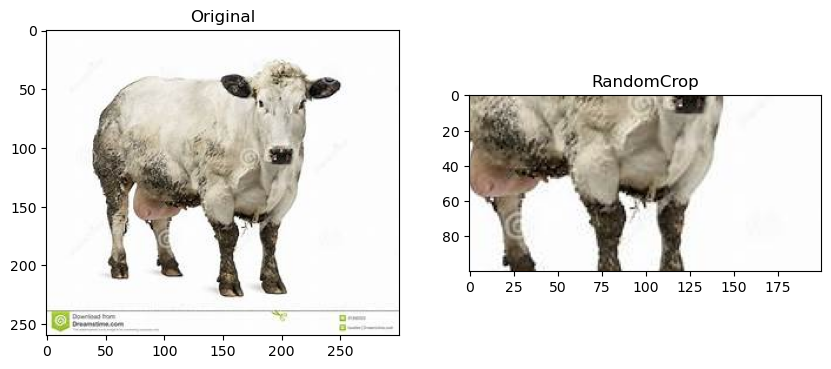

(100, 200, 3)

In [34]:
aug = A.RandomCrop(height=100, width=200, p=1)

repeat_aug(original_image=image, target='RandomCrop', aug=aug)
aug(image=image)['image'].shape

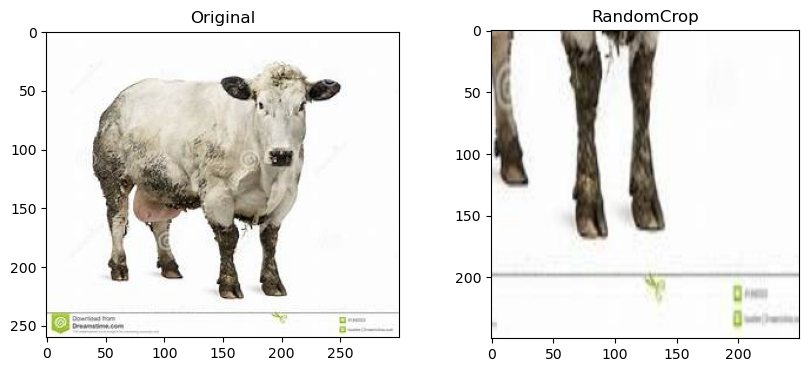

(250, 250, 3)

In [35]:
aug = A.Compose([
    A.RandomCrop(height=100, width=200, p=1),
    A.Resize(250, 250)
])

repeat_aug(original_image=image, target='RandomCrop', aug=aug)
aug(image=image)['image'].shape

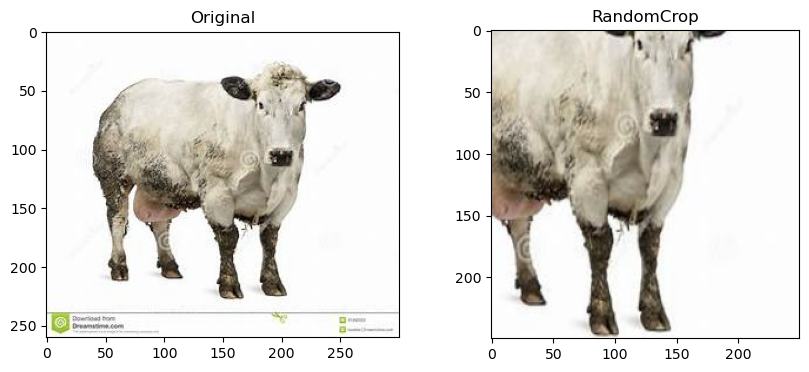

(250, 250, 3)

In [36]:
# 특정 범위를 scale 만큼 잘라낸 후, 전달한 width와 height 크기로 Resize 한다.
# 원본 이미지가 100x100일 경우 scale(0.1, 0.5)를 적용하면,
# 10 ~ 50% 범위의 랜점한 영역을 잘라낸 후 resize 해준다.
aug = A.RandomResizedCrop(height=250, width=250, scale=(0.2, 0.5), p=1)

repeat_aug(original_image=image, target='RandomCrop', aug=aug)
aug(image=image)['image'].shape

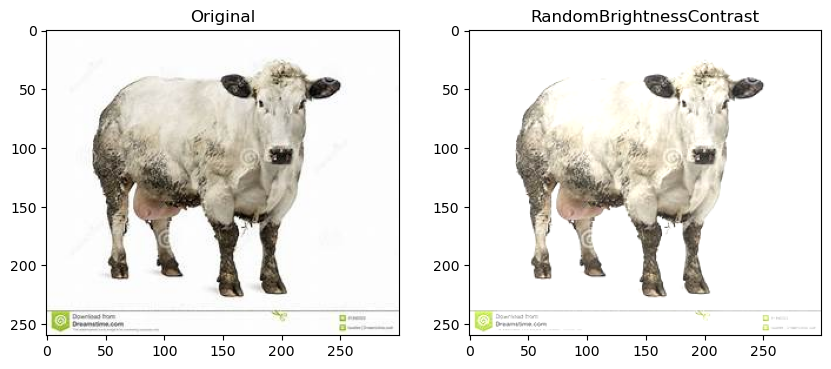

In [37]:
# 밝기, 대비
# 0.2 == (-0.2, 0.2)
# 개별 작업 진행시, 나머지는 0을 전달한다.
aug = A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=1)

repeat_aug(original_image=image, target='RandomBrightnessContrast', aug=aug)

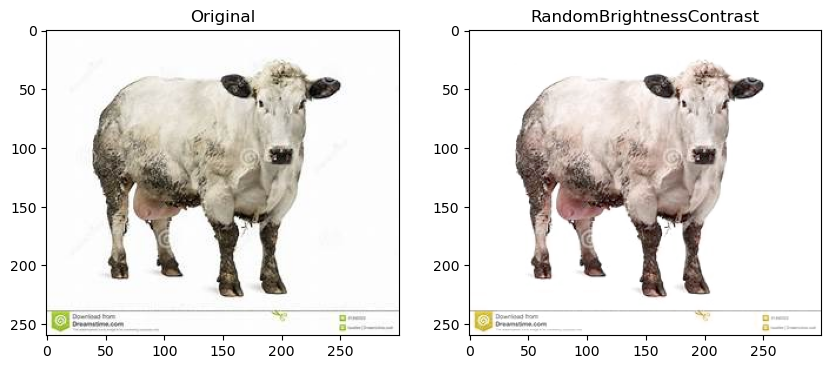

In [38]:
# 색상, 채도, 명도
# hue_shift_limit
# sat_shift_limit
# val_shifg_limit
aug = A.HueSaturationValue(p=1)

repeat_aug(original_image=image, target='RandomBrightnessContrast', aug=aug)

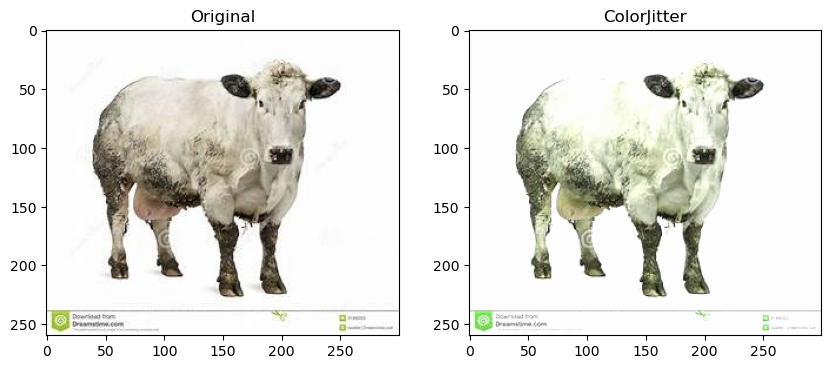

In [39]:
# 밝기, 대비, 채도, 색상
aug = A.ColorJitter(p=1)

repeat_aug(original_image=image, target='ColorJitter', aug=aug)

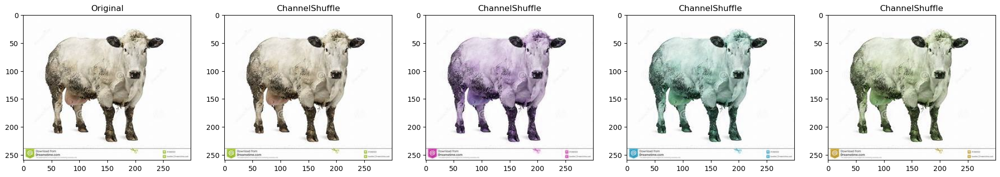

In [40]:
# 채널 위치 변경
aug = A.ChannelShuffle(p=1)

repeat_aug(original_image=image, target='ChannelShuffle', aug=aug, ncols=5)

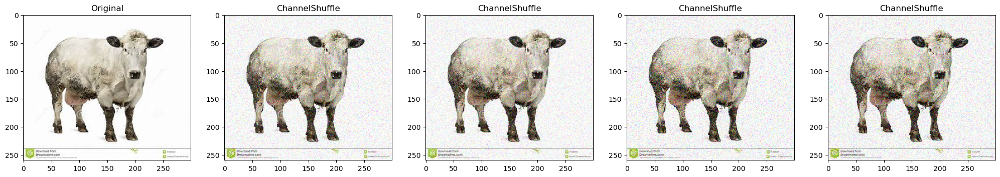

In [41]:
# 가우아시안 분포(정규 분포)를 사용해서 Noise를 생성한다.
aug = A.GaussNoise(p=1, var_limit=(400, 900))

repeat_aug(original_image=image, target='ChannelShuffle', aug=aug, ncols=5)

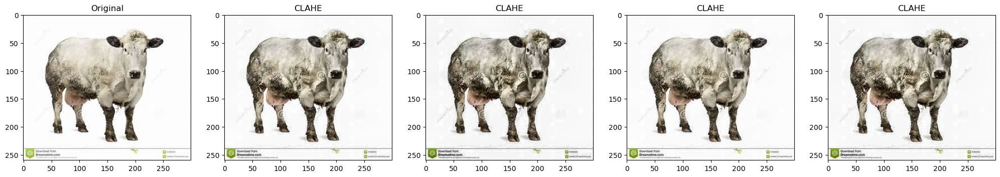

In [42]:
# 명암대비가 선명한 정도 조정
aug = A.CLAHE(p=1, clip_limit=4)

repeat_aug(original_image=image, target='CLAHE', aug=aug, ncols=5)

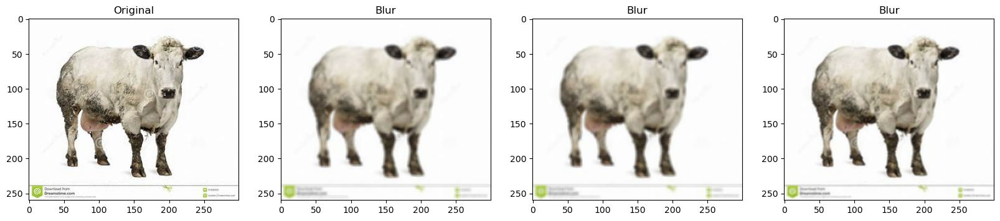

In [44]:
# 흐려지게 하기
aug = A.Blur(p=1, blur_limit=(3, 5))

repeat_aug(original_image=image, target='Blur', aug=aug, ncols=4)

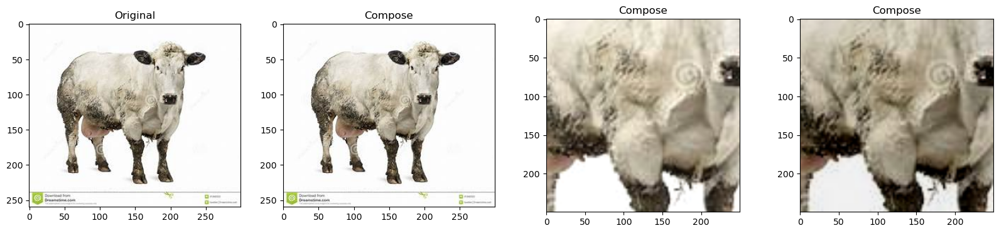

In [45]:
aug = A.Compose([
    A.CenterCrop(height=100, width=100, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Resize(250, 250, p=1)
], p=0.5)

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=4)

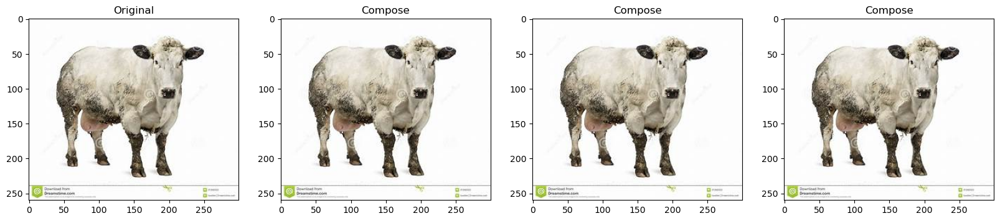

In [46]:
# Compose는 전부 다 적용되지만, 여러개 중 한 개만 골라서 적용되는건 OneOf
# 보통 Compose 안에서 Oneof를 쓴다.
# 여러 개 중 한 개만 골라서 적용
aug = A.OneOf([
    A.CenterCrop(height=100, width=100, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Resize(250, 250, p=1)
], p=0.5)

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=4)

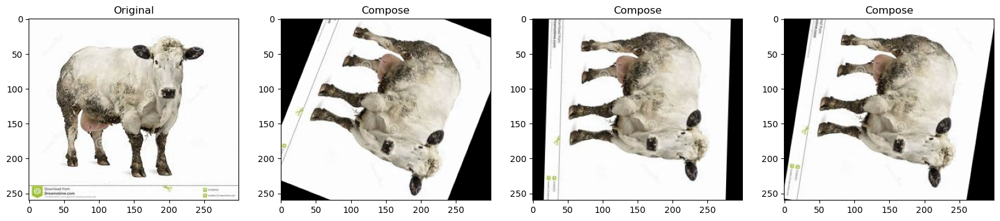

In [47]:
aug = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=1),
    A.Rotate(limit=(45, 90), p=1, border_mode=cv2.BORDER_CONSTANT),
    A.OneOf([
        A.CLAHE(p=0.3),
        A.Blur(blur_limit=(10, 15), p=0.3)
    ], p=0.5)
])

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=4)

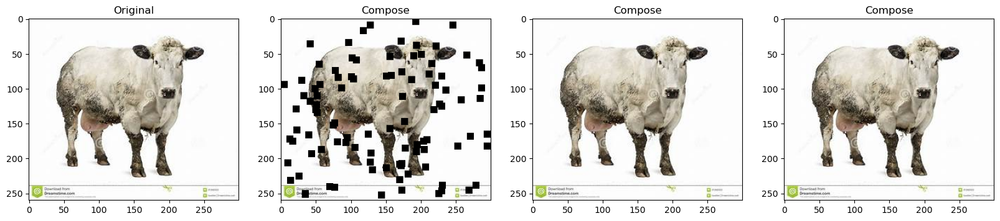

In [48]:
# 검은색 정사각형을 랜덤하게 배치하여 noise를 발생시킨다.
aug = A.CoarseDropout(max_holes=100, max_height=10, max_width=10, p=0.5)

repeat_aug(original_image=image, target='Compose', aug=aug, ncols=4)


### 🚩정리
#### 기본적으로 많이 사용되는 변환은 아래와 같다.

- Veritcal
- Horizontal
- ShiftScaleRotation
- RandomCrop, CenterCrop, RandomBrightnessContrast
- ColorJitter
- CLAHE, Blur, CoarseDropout

In [49]:
# fit을 2 ~ 3번 정도 해야한다. p는 랜덤으로.

In [50]:
import albumentations as A
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def transform(image):
    aug = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.OneOf([
            A.ColorJitter(p=0.5),
            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5)    
        ], p=1)
    ], 0.5)

    return aug(image=image)['image']

idg = ImageDataGenerator(preprocessing_function=transform, rescale=1./255)